In [41]:
! pip install opencv-contrib-python
! pip install scikit-learn
! pip install more-itertools
! pip install scikit-image
! pip install matplotlib
! pip install numpy
! pip install opencv-python
! pip install rembg
! pip install Pillow

In [42]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [43]:
def show_dataset(images_class, label):
    # show data for 1 class
    plt.figure(figsize=(14,5))
    k = 0
    for i in range(1,6):
        plt.subplot(1,5,i)
        try :
            plt.imshow(images_class[k][:,:,::-1])
        except :
            plt.imshow(images_class[k], cmap='gray')
        plt.title(label)
        plt.axis('off')
        plt.tight_layout()
        k += 1
    plt.show()



In [44]:
dataset_folder_ori = "dataset/"


names_ori = []
images_ori = []


for folder in os.listdir(dataset_folder_ori):
    for name in os.listdir(os.path.join(dataset_folder_ori, folder))[:10]: 
        if name.find(".jpg") > -1 :
            img = cv2.imread(os.path.join(dataset_folder_ori + folder, name))
            images_ori.append(img)
            names_ori.append(folder)
              
                
                

            

In [45]:
labels_ori = np.unique(names_ori)
labels_ori





array(['Isnaini', 'afrizal', 'agus sami', 'akmal', 'andi', 'anoerimam',
       'ari', 'ayu', 'bambang wirawan', 'cut', 'fandi', 'farah angraini',
       'firli', 'fitriani', 'hafiz', 'hendri', 'ibnu', 'ika suriani',
       'isfandiar', 'laina farsiah', 'muammar', 'mukhtasar', 'nur',
       'nurjannah', 'rahma', 'rahmi', 'reza ramadhan', 'safwaturrahman',
       'sarah', 'srihandayani', 'suljol', 'susi', 'teuku', 'tmisra',
       'yanti', 'yuli', 'zulfikar'], dtype='<U15')

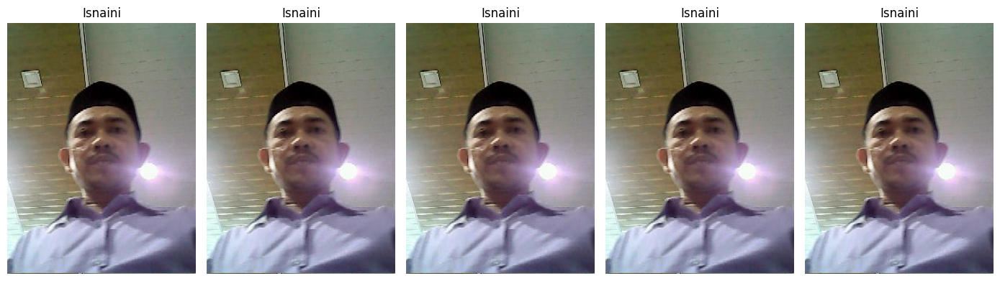

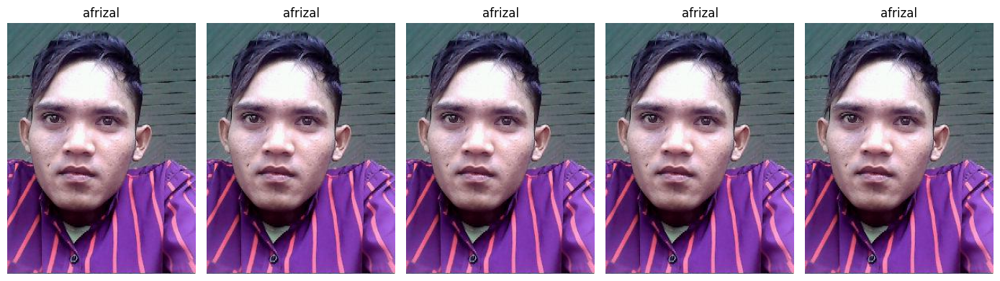

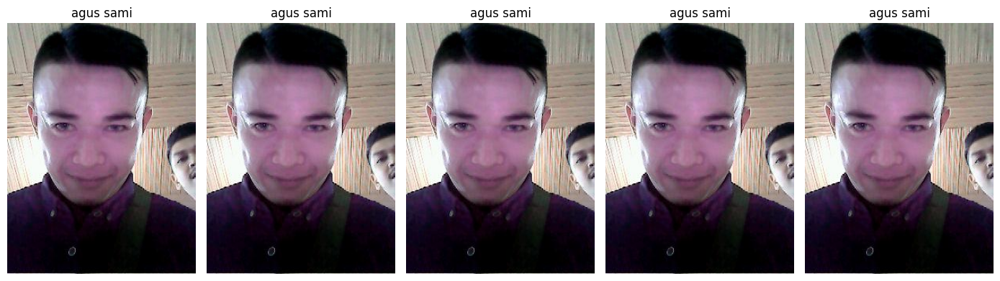

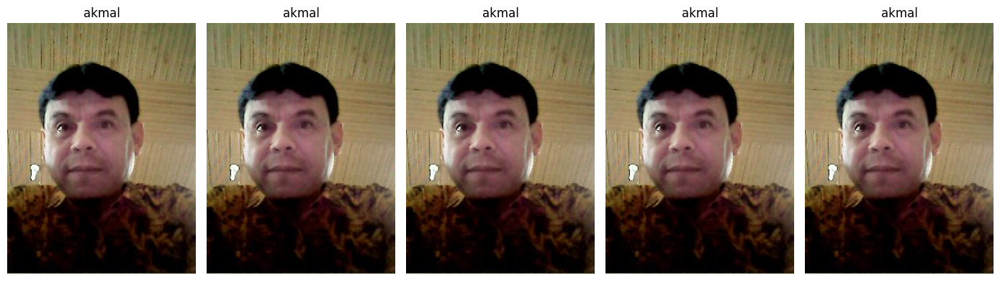

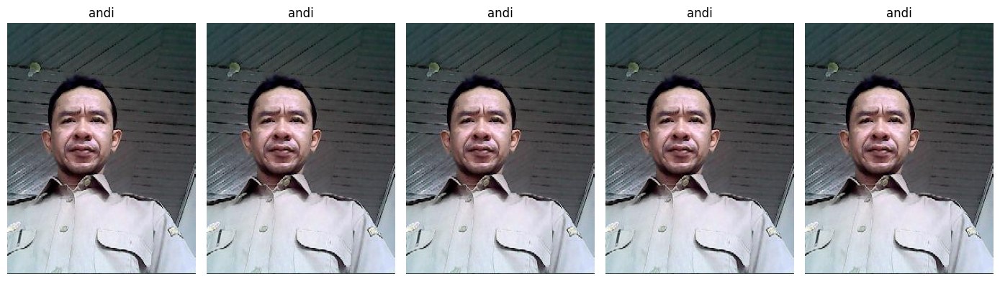

...

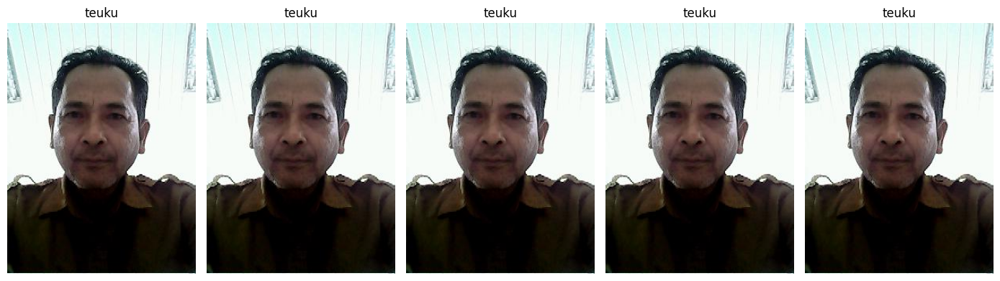

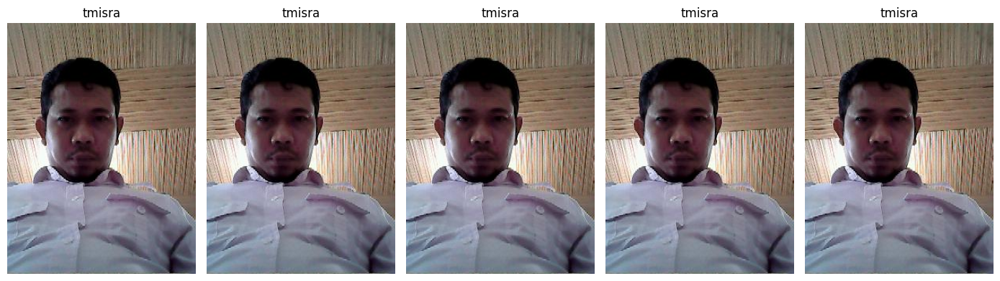

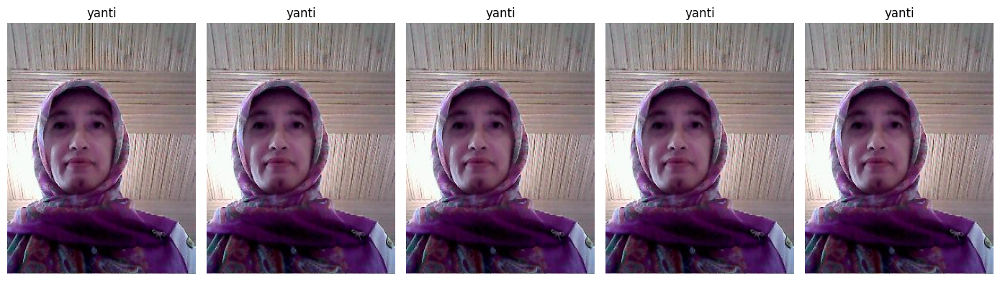

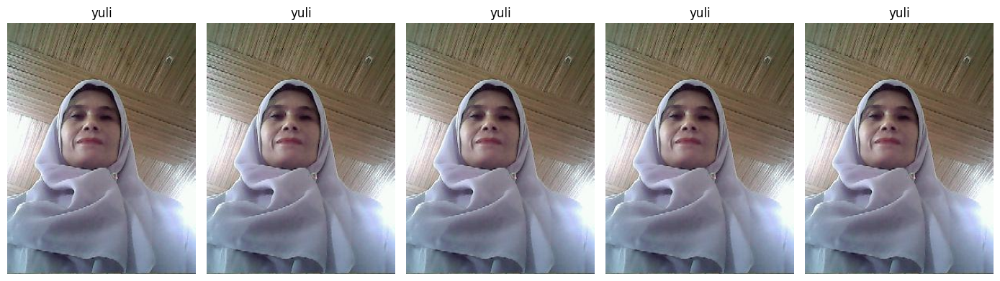

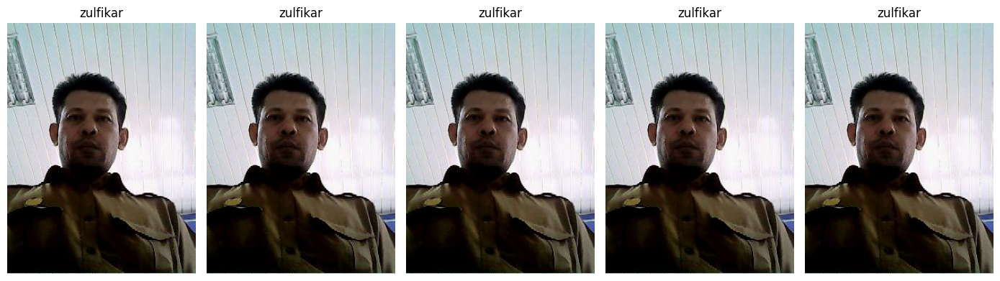

In [46]:
for label in labels_ori:
    
    ids = np.where(label== np.array(names_ori))[0]
    images_class = images_ori[ids[0] : ids[-1] + 1]
    show_dataset(images_class, label)

In [47]:
from rembg import remove

dataset_folder = "dataset/"
direktori_remove="remove_bg/"


names_rmbg = []
images_rmbg = []

for folder in os.listdir(dataset_folder):
    for name in os.listdir(os.path.join(dataset_folder, folder))[:10]: 
        if name.find(".jpg") > -1 :
            img = cv2.imread(os.path.join(dataset_folder + folder, name))
            img_remove = remove(img)

            try:
                os.makedirs(str(direktori_remove)+'/'+str(folder))
            except FileExistsError:
                output_path = direktori_remove +'/'+folder+'/'+str(name)
                cv2.imwrite(output_path,img_remove)
                images_rmbg.append(img_remove)
                names_rmbg.append(folder)
                

In [48]:
dataset_folder = "remove_bg/"


names= []
images= []


for folder in os.listdir(dataset_folder):
    for name in os.listdir(os.path.join(dataset_folder, folder))[:10]: 
        if name.find(".jpg") > -1 :
            img = cv2.imread(os.path.join(dataset_folder + folder, name))
            images.append(img)
            names.append(folder)

          

In [49]:
labels = np.unique(names)
labels

array(['Isnaini', 'afrizal', 'agus sami', 'akmal', 'andi', 'anoerimam',
       'ari', 'ayu', 'bambang wirawan', 'cut', 'fandi', 'farah angraini',
       'firli', 'fitriani', 'hafiz', 'hendri', 'ibnu', 'ika suriani',
       'isfandiar', 'laina farsiah', 'muammar', 'mukhtasar', 'nur',
       'nurjannah', 'rahma', 'rahmi', 'reza ramadhan', 'safwaturrahman',
       'sarah', 'srihandayani', 'suljol', 'susi', 'teuku', 'tmisra',
       'yanti', 'yuli', 'zulfikar'], dtype='<U15')

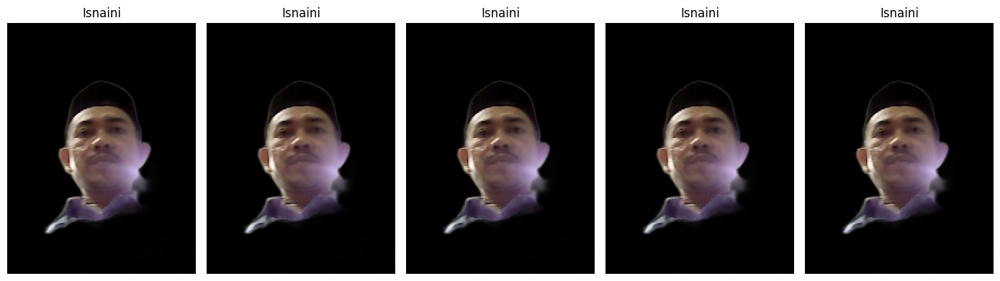

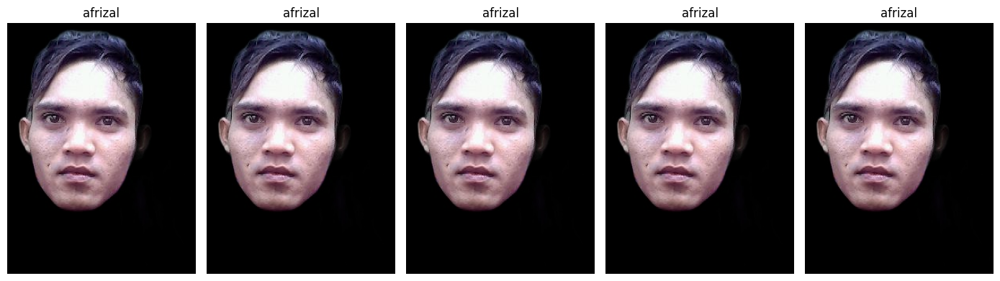

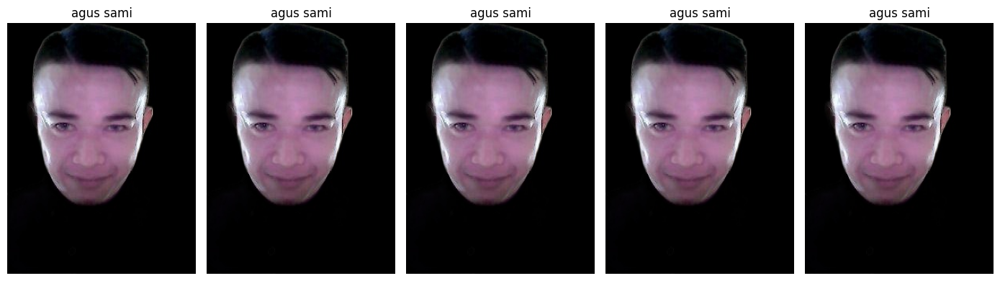

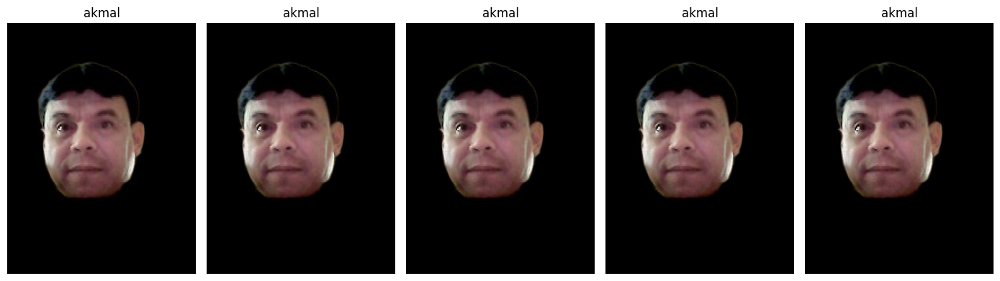

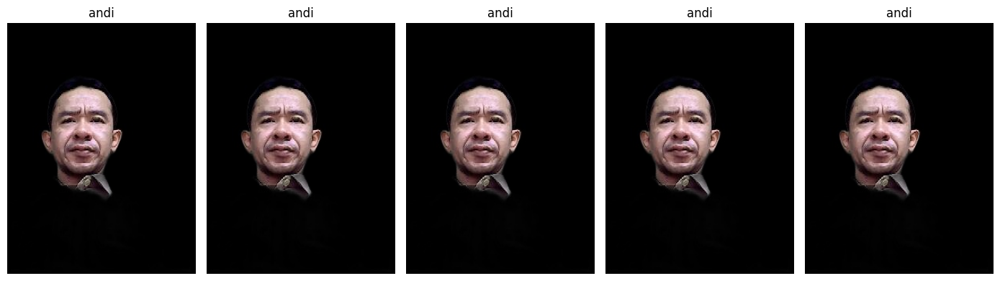

...

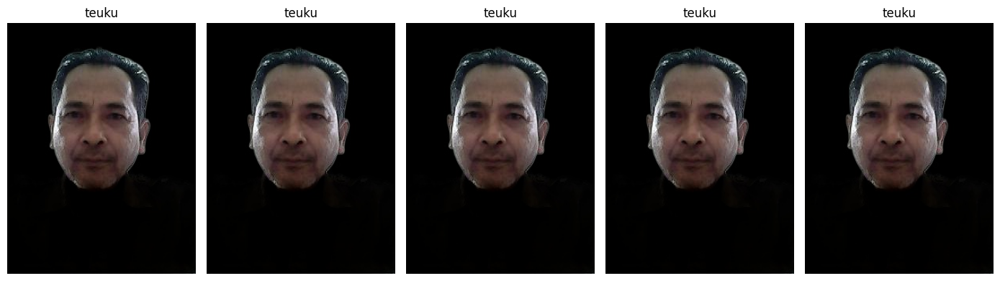

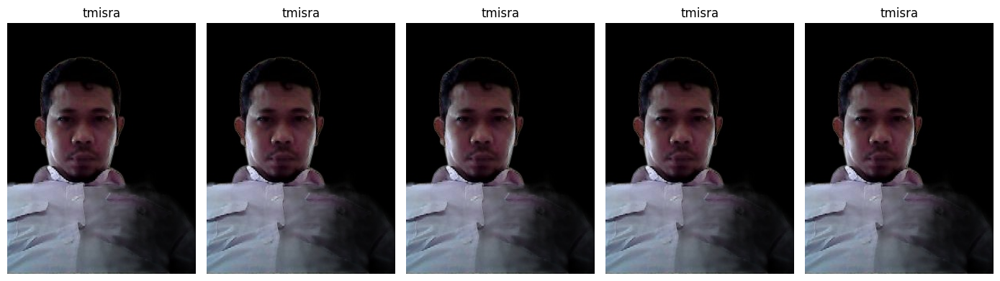

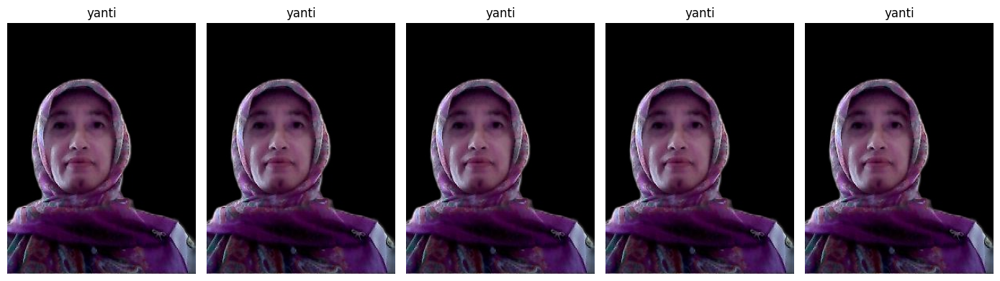

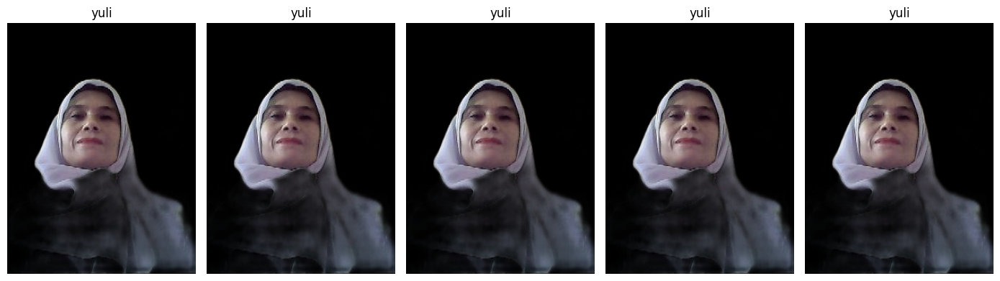

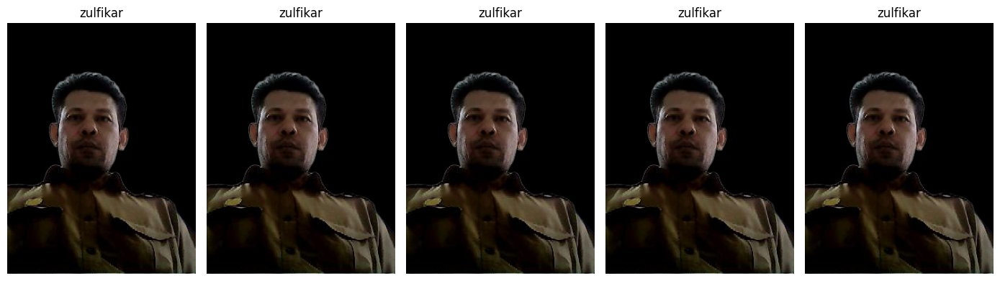

In [50]:

for label in labels:
    
    ids = np.where(label== np.array(names))[0]
    images_class_baru = images[ids[0] : ids[-1] + 1]
    show_dataset(images_class_baru, label)
    



In [51]:

face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_default.xml')

In [1]:


def detect_face(img, idx):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(img, 1.3, 5)
    try :
        x, y, w, h = faces[0]

        img = img[y:y+h, x:x+w] 
        img = cv2.resize(img, (100, 100))
    except :
        print("Wajah tidak ditemukan", i)
        img = None
    return img



In [2]:
croped_images = []
for i, img in enumerate(images) :
    img = detect_face(img, i)
    if img is not None :
        croped_images.append(img)
    else :
        del names[i]



NameError: name 'images' is not defined

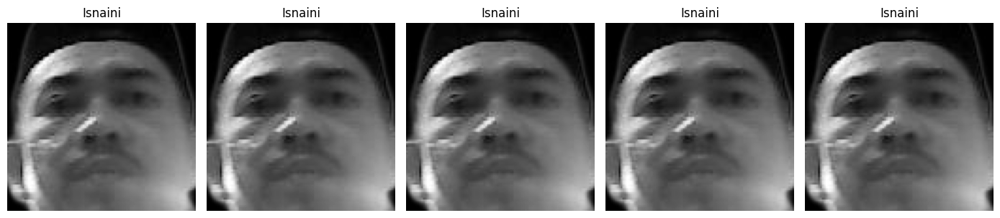

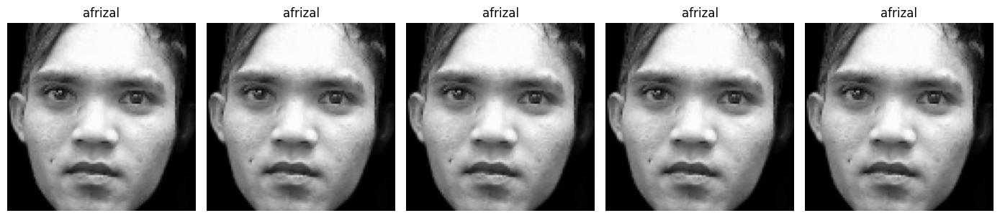

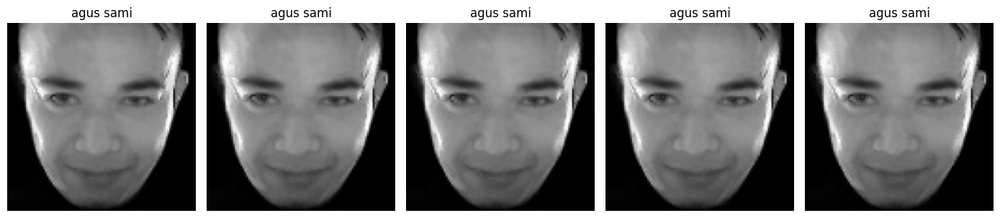

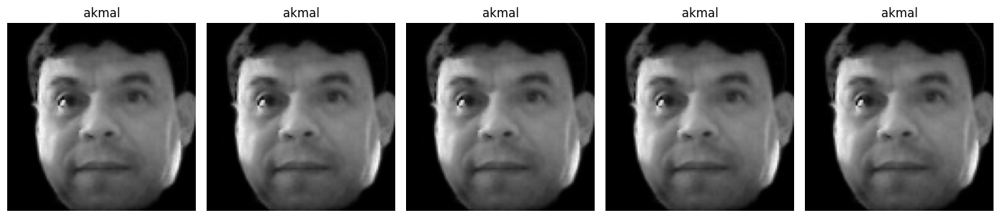

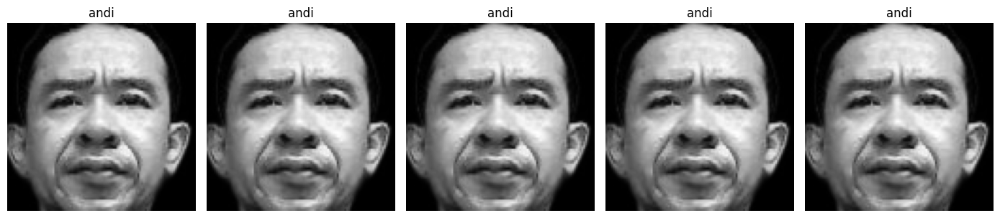

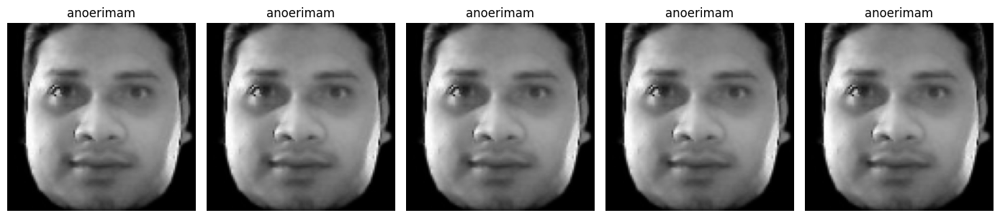

IndexError: list index out of range

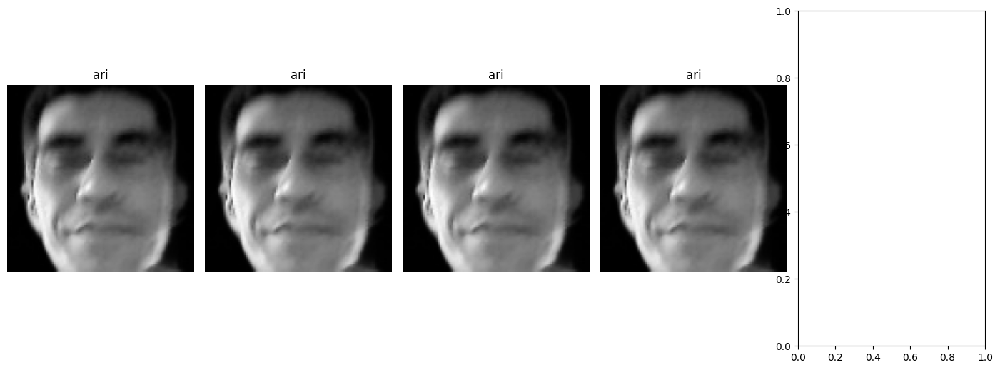

In [79]:
for label in labels:
    
    ids = np.where(label== np.array(names))[0]
    images_class = croped_images[ids[0] : ids[-1] + 1] # select croped images for each class
    show_dataset(images_class, label)

In [56]:

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

le.fit(names)

print(le.classes_)
name_vec = le.transform(names)
print(name_vec)

['Isnaini' 'afrizal' 'agus sami' 'akmal' 'andi' 'anoerimam' 'ari' 'ayu'
 'bambang wirawan' 'cut' 'fandi' 'farah angraini' 'firli' 'fitriani'
 'hafiz' 'hendri' 'ibnu' 'ika suriani' 'isfandiar' 'laina farsiah'
 'muammar' 'mukhtasar' 'nur' 'nurjannah' 'rahma' 'rahmi' 'reza ramadhan'
 'safwaturrahman' 'sarah' 'srihandayani' 'suljol' 'susi' 'teuku' 'tmisra'
 'yanti' 'yuli' 'zulfikar']
[ 1  1  1  1  1  1  1  1  1  1  2  2  2  2  2  2  2  2  2  3  3  3  3  3
  3  3  3  3  4  4  4  4  4  4  4  4  4  5  5  5  5  5  5  5  5  5  6  6
  6  6  7  7  7  7  7  8  8  8  8  8  8  8  8  8  9  9  9  9  9  9  9  9
  9 10 10 10 10 10 10 10 10 10 11 11 11 11 11 11 11 11 11 12 12 12 12 13
 13 13 13 13 14 14 14 14 14 14 14 14 14 15 15 15 15 15 15 15 15 15 16 16
 16 16 16 16 16 16 16 17 17 17 17 17 17 17 17 17 18 18 18 18 18 18 18 18
 18  0  0  0  0  0  0  0  0  0 19 19 19 19 19 19 19 19 19 20 20 20 20 20
 20 20 20 20 20 21 21 21 21 21 21 21 21 21 22 22 22 22 22 22 22 22 22 23
 23 23 23 23 23 23 23 23 24 24 24

In [57]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(np.array(croped_images, dtype=np.float32),   # input data
                                                    np.array(name_vec),                            # target/output data 
                                                    test_size=0.25, 
                                                    random_state=42)

print(x_train.shape, y_train.shape, x_test.shape,  y_test.shape)

(231, 100, 100) (231,) (77, 100, 100) (77,)


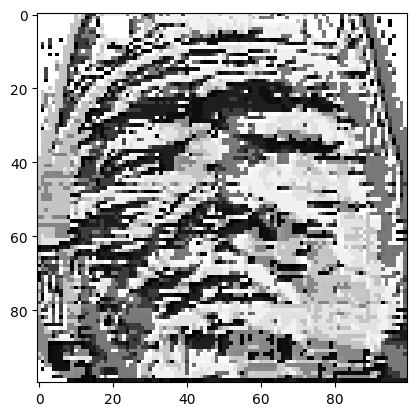

In [58]:
from skimage.feature import local_binary_pattern
P = 8
R = 1
img = x_train[0]
lbp_img = local_binary_pattern(img, P=P, R=R, method="default")
plt.imshow(lbp_img, cmap="gray")

In [60]:

H = np.histogram(lbp_img.ravel(),                          
                 bins=2**P,                          
                 range=(0, 2**P),
                 density=True)[0] 



print(H)



[0.03 0.01 0.   0.01 0.01 0.   0.   0.02 0.   0.   0.   0.   0.   0.
 0.01 0.03 0.02 0.   0.   0.   0.   0.   0.   0.   0.01 0.   0.   0.
 0.02 0.   0.03 0.02 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 0.   0.   0.   0.   0.   0.   0.01 0.   0.   0.   0.   0.   0.   0.
 0.01 0.   0.   0.   0.02 0.   0.02 0.   0.01 0.   0.   0.   0.   0.
 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.01 0.
 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 0.02 0.   0.   0.   0.   0.   0.   0.   0.05 0.   0.   0.   0.02 0.
 0.01 0.   0.   0.01 0.   0.01 0.   0.   0.   0.03 0.   0.   0.   0.
 0.   0.   0.   0.02 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.03 0.   0.04
 0.   0.   0.   0.04 0.   0.   0

<function matplotlib.pyplot.show(close=None, block=None)>

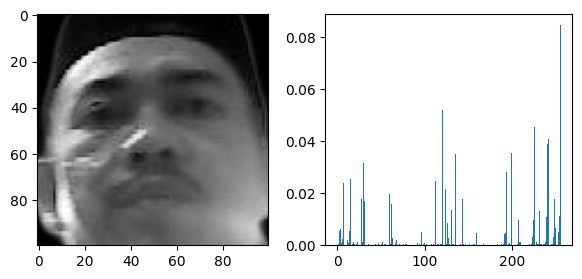

In [61]:
plt.figure(figsize=(7,3))
plt.subplot(1,2,1)
plt.imshow(img, cmap="gray")

plt.subplot(1,2,2)
axis = np.arange(len(H))
plt.bar(axis, H)

plt.show



In [63]:
from sklearn.neighbors import NearestNeighbors
class LBPHFaceRecognizer_custom():
    #
    # ----- class for LBPH + Nearest Neighbours (chi 2) ------
    #
    def __init__(self):
        self.neigh = NearestNeighbors(n_neighbors=1, radius=0.4, metric=self.chi2_distance)
        self.face_histograms = []
        self.y = []
    
    def chi2_distance(self, hist1, hist2, gamma=0.5): 
        chi = gamma * np.sum(((hist1 - hist2) ** 2) / (hist1 + hist2 + 1e-7))
        return chi
    
    def find_lbp_histogram(self, image, P=8, R=1, eps=1e-7, n_window=(8,8)):
        E = []
        h, w = image.shape
        h_sz = int(np.floor(h/n_window[0]))
        w_sz = int(np.floor(w/n_window[1]))
        lbp_img = local_binary_pattern(image, P=P, R=R, method="default")
        for (x, y, C) in self.sliding_window(lbp_img, stride=(h_sz, w_sz), window=(h_sz, w_sz)):
            if C.shape[0] != h_sz or C.shape[1] != w_sz:
                continue
            H = np.histogram(C,                          
                             bins=2**P, 
                             range=(0, 2**P),
                             density=True)[0] 
            
            H = H.astype("float")
            H /= (H.sum() + eps)
            E.extend(H)
        return E
    
    def sliding_window(self, image, stride, window):
        for y in range(0, image.shape[0], stride[0]):
            for x in range(0, image.shape[1], stride[1]):
                yield (x, y, image[y:y + window[1], x:x + window[0]])
                   
    def train(self, x, y):
        self.y = y
        self.face_histograms = [self.find_lbp_histogram(img) for img in x]
        self.neigh.fit(self.face_histograms)
    
    def predict(self, x):
        hists = [self.find_lbp_histogram(img) for img in x]
        dist, idx = self.neigh.kneighbors(hists)
        pred_id = np.array([self.y[i[0]] for i in idx])
        return pred_id, dist[0]

In [64]:
model_lbph_custom = LBPHFaceRecognizer_custom()
model_lbph_custom.train(x_train, y_train)
y_predict = model_lbph_custom.predict(x_test)[0]
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [66]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(6, 6))
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

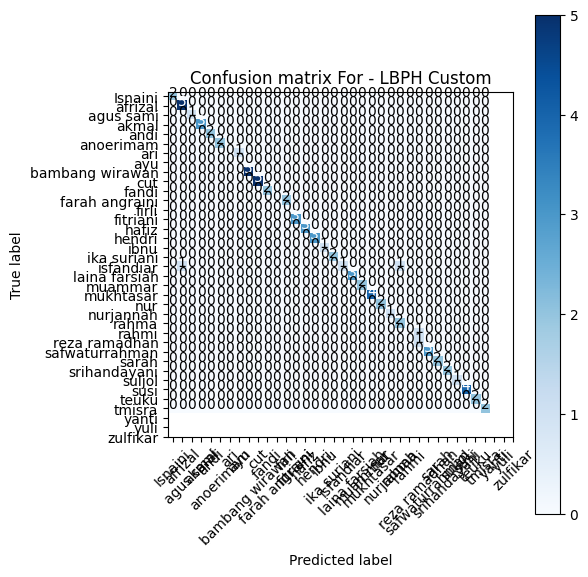

In [67]:


# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test, y_predict)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
plot_confusion_matrix(cnf_matrix, classes=labels,normalize=False,
                      title='Confusion matrix For - LBPH Custom')



In [68]:
print("== Classification Report for - LBPH Custom ==\n")
print(classification_report(y_test, 
                            y_predict, 
                            ))

== Classification Report for - LBPH Custom ==

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       0.83      1.00      0.91         5
           2       1.00      1.00      1.00         1
           3       1.00      1.00      1.00         3
           4       1.00      1.00      1.00         2
           5       1.00      1.00      1.00         2
           6       0.00      0.00      0.00         1
           7       0.00      0.00      0.00         0
           8       1.00      1.00      1.00         5
          10       1.00      1.00      1.00         5
          11       1.00      1.00      1.00         2
          12       0.00      0.00      0.00         2
          13       0.00      0.00      0.00         0
          14       1.00      1.00      1.00         3
          15       1.00      1.00      1.00         3
          16       1.00      1.00      1.00         3
          18       1.00      1.00 

C:\Users\amar\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\amar\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\amar\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetric

In [69]:
! pip install opencv-contrib-python
import cv2

model = cv2.face_LBPHFaceRecognizer.create()
model.train(croped_images, name_vec)
model.save("lbph_model.yml")
model.read("lbph_model.yml")

Actual 	:  1.jpg
Predic 	:  Isnaini
Confidence 	:  83


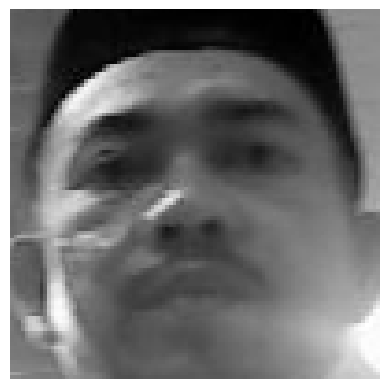

In [70]:
test_folder = "test/"
actual_names = []
predicted_names = []
confidences = []
for filename in os.listdir(test_folder):
    if filename.find(".jpg") > -1:
        path = os.path.join(test_folder, filename)
        
        imgx = cv2.imread(path)
        imgy = detect_face(imgx, 0)
        gray = cv2.cvtColor(imgx, cv2.COLOR_BGR2GRAY)
        face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_default.xml')
        faces_detected = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)
        for (x, y, w, h) in faces_detected:
            cv2.rectangle(img, pt1=(x, y), pt2=(x + w, y + h), color=(255, 0, 0), thickness=2)
            Id,pred = model.predict(gray[y:y + h, x:x + w])
    
            confidence = int(100*(1-pred/300))
      
        
            actual_names.append(filename)
            predicted_names.append(Id)
            confidences.append(confidence)
        
            print("Actual \t: ", filename)
            print("Predic \t: ", labels[Id])
            print("Confidence \t: ",confidence)
            

        plt.figure()
        plt.imshow(imgy, cmap="gray")
        plt.axis(False)
        plt.show()



In [ ]:


from sklearn.metrics import confusion_matrix


import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(6, 6))
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

(15, 100, 100) (15,) (5, 100, 100) (5,)


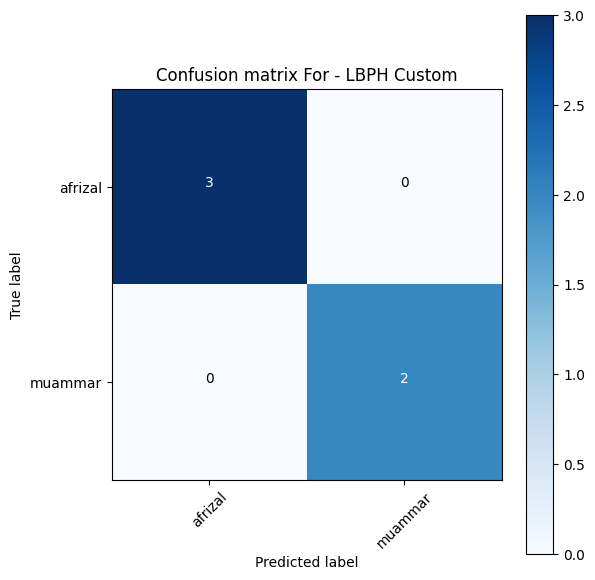

In [ ]:

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(np.array(croped_images, dtype=np.float32),   # input data
                                                    np.array(name_vec),                            # target/output data 
                                                    test_size=0.25, 
                                                    random_state=42)
print(x_train.shape, y_train.shape, x_test.shape,  y_test.shape)




# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test, y_predict)
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
plot_confusion_matrix(cnf_matrix, classes=labels,normalize=False,
                      title='Confusion matrix For - LBPH Custom')





In [ ]:
from sklearn.metrics import classification_report

print("== Classification Report for Test Dataset ==\n")
print(classification_report(y_test, 
                            y_predict, 
                            target_names=None
                            ))


== Classification Report for Test Dataset ==

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       1.00      1.00      1.00         2

    accuracy                           1.00         5
   macro avg       1.00      1.00      1.00         5
weighted avg       1.00      1.00      1.00         5

